## Hierarchical Agglomerative Clustering
Author: Adrien Loiseau

In [1]:
# Run the help_functions.py script to have acces to the imports and helper functions
%run help_functions.py

##### Load the dataset containing the 500 hPa geopotential height data

In [2]:
file_name = "Data/ERA5_geopotential_500hPa_1940_2025_winter_midnight_Euro_Atlantic.nc"
dataset_dict = load_dataset(file_name=file_name)

Geopotential height dataset (0.25°x0.25°): (nb_days=7731, nb_lats=241, nb_longs=561, grid_size=135201)
Geopotential height dataset (0.50°x0.50°): (nb_days=7731, nb_lats=121, nb_longs=281, grid_size=34001)
Geopotential height data: (7731, 121, 281)
Reshaped geopotential height data: (7731, 34001)
Geopotential height anomalies: (7731, 121, 281)
Reshaped geopotential height anomalies: (7731, 34001)
Daily winter data from 1940 to 2025 successfully loaded. Loading time: 61.05 seconds.


### Apply PCA to the geopotential height anomalies

In [3]:
nb_modes = 9
data_for_PCA = dataset_dict["geopotential_height_anomalies_reshaped"]

### Run PCA with nb_modes modes ###
start_time = time.time()
pca = PCA(n_components=nb_modes).fit(data_for_PCA)
end_time = time.time() ; print(f"PCA algorithm with {nb_modes} modes performed in {end_time-start_time:.2f} seconds.")

### Calculate the explained variance by the first nb_modes PCA modes ###
explained_variance = pca.explained_variance_ratio_ * 100
print(f"Total explained variance by the first {nb_modes} PCA modes: {explained_variance.sum():.2f}%")

### Transform the geopotential height anomalies using the PCA model (Project the data onto the first nb_modes PCA modes) ###
PCA_transformed_data = pca.transform(data_for_PCA)
print(f"Transformed geopotential height shape: {PCA_transformed_data.shape}")
print(f"Principal components shape: {pca.components_.shape}")

data_for_clustering = PCA_transformed_data

PCA algorithm with 9 modes performed in 4.97 seconds.
Total explained variance by the first 9 PCA modes: 76.09%
Transformed geopotential height shape: (7731, 9)
Principal components shape: (9, 34001)


In [4]:
def plot_dendrogram(clustering, color_threshold, method, p=7, savefig=False):
    ### Source: https://scikit-learn.org/stable/auto_examples/cluster/plot_agglomerative_dendrogram.html#sphx-glr-auto-examples-cluster-plot-agglomerative-dendrogram-py
    """
    A dendrogram is a diagram that shows the arrangement of the clusters produced by the hierarchical clustering algorithm.
    The length of the two vertical lines of a U-link represents the distance between the two clusters.
    """
    linkage_matrix = linkage(data_for_clustering, method=method) # Perform the hierarchical clustering

    ### Plot the dendrogram ###
    plt.figure(figsize=(10, 4))
    dendrogram(linkage_matrix, truncate_mode="level", p=p, distance_sort="ascending", color_threshold=color_threshold, above_threshold_color='black', no_labels=True)
    """
    truncate_mode="level": No more than p levels of the dendrogram tree are displayed. A “level” includes all nodes with p merges from the final merge.
    color_threshold: Colors all the descendent links below a cluster node (if is the first node below the color_threshold), with the same color. 
                    All links connecting nodes with distances greater than or equal to the threshold are colored with the above_threshold_color.
    """
    # plt.axhline(y=color_threshold, c='grey', lw=1, linestyle='dashed')
    plt.ylabel("Inter-cluster distance", fontsize=13) ; plt.yticks(np.arange(0, 900001, 100000), np.arange(0, 900001, 100000), fontsize=13) ; plt.grid()
    if (savefig == True): plt.savefig(f"Images/HAC_{method}_linkage_dendrogram_PCA_{nb_modes}_modes.png", dpi=300, bbox_inches='tight')
    plt.show()

    ### Represent the dendrogram as a tree ###
    rootnode, nodelist = to_tree(Z=linkage_matrix, rd=True)

    nb_clusters = 1
    def node_count(node, nb_clusters):
        if (nb_clusters <= 5):
            print("\t"*(nb_clusters-1) + f"{nb_clusters}: {node.get_count() / len(data_for_clustering) * 100:.1f}") ; nb_clusters += 1
            node_count(node.get_left(), nb_clusters)
            node_count(node.get_right(), nb_clusters)
        else: return
    print("Number of leaves under each node:")
    node_count(rootnode, nb_clusters)

    nb_clusters_to_plot = 25-1
    plt.figure(figsize=(10, 4))
    plt.plot(linkage_matrix[:, 2][-nb_clusters_to_plot:], marker='o', linewidth=2) ; plt.grid()
    plt.xticks(np.arange(nb_clusters_to_plot), np.arange(nb_clusters_to_plot+1, 1, -1), fontsize=13) ; plt.yticks(fontsize=13)
    plt.xlabel("Number of clusters to be merged", fontsize=13) ; plt.ylabel("Inter-cluster distance", fontsize=13) ; plt.margins(x=0.02)
    if (savefig == True): plt.savefig(f"Images/HAC_{method}_linkage_distance_metric_PCA_{nb_modes}_modes.png", dpi=300, bbox_inches='tight')
    plt.show()

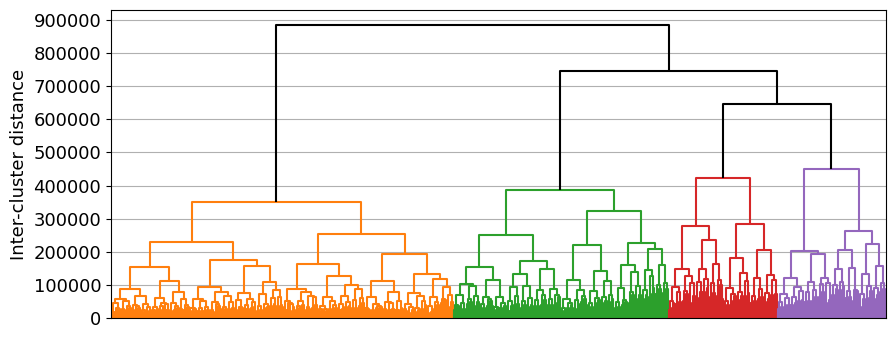

Number of leaves under each node:
1: 100.0
	2: 17.7
		3: 8.8
			4: 3.1
				5: 1.6
				5: 1.5
			4: 5.6
				5: 2.1
				5: 3.6
		3: 9.0
			4: 3.8
				5: 1.7
				5: 2.1
			4: 5.2
				5: 1.6
				5: 3.5
	2: 82.3
		3: 29.2
			4: 10.2
				5: 4.3
				5: 5.9
			4: 19.0
				5: 5.1
				5: 13.9
		3: 53.1
			4: 25.2
				5: 14.1
				5: 11.1
			4: 27.9
				5: 10.4
				5: 17.4


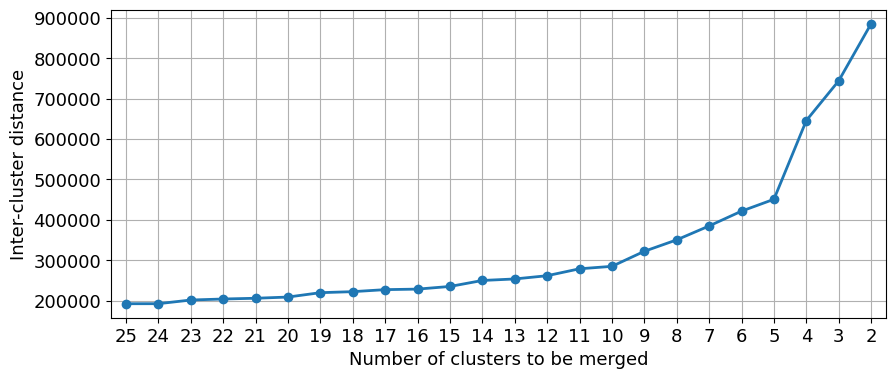

In [5]:
plot_dendrogram(clustering=None, color_threshold=5e5, method="ward", p=10, savefig=False)

In [6]:
def plot_centroids(nb_clusters, method, weather_regime=False):
    nb_lats = len(dataset_dict["lats"]) ; nb_longs = len(dataset_dict["longs"])

    clustering = models_ward[nb_clusters-1] ; y_pred = clustering.labels_

    if (nb_clusters == 1):
        centroids_original_space = (np.mean(data_for_clustering, axis=0) @ pca.components_).reshape(1, nb_lats, nb_longs)
    else:
        ### Find the centroids of the clusters with the NearestCentroid classifier ###
        # Source: https://stackoverflow.com/questions/56456572/how-to-get-agglomerative-clustering-centroid-in-python-scikit-learn
        clf = NearestCentroid().fit(data_for_clustering, y_pred)
        centroids_original_space = (clf.centroids_ @ pca.components_).reshape(nb_clusters, nb_lats, nb_longs)

    frequency_array = np.bincount(y_pred) / len(y_pred) * 100
    # sorted_indices = np.argsort(frequency_array)[::-1]

    divided_cluster = np.zeros(nb_clusters) ; cluster_to_divide = nb_clusters+1
    if (nb_clusters > 1):
        previous_clustering = models_ward[nb_clusters-2] ; previous_y_pred = previous_clustering.labels_
        previous_frequency_array = np.array([np.sum(previous_y_pred == cluster_idx) / len(previous_y_pred) * 100 for cluster_idx in range(nb_clusters-1)])
        for i in range(len(frequency_array)):
            if (frequency_array[i] not in previous_frequency_array):
                divided_cluster[i] = 1

    if (nb_clusters == len(models_ward)):
        cluster_to_divide = None
    else:
        nex_clustering = models_ward[nb_clusters] ; next_y_pred = nex_clustering.labels_
        next_frequency_array = np.array([np.sum(next_y_pred == cluster_idx) / len(next_y_pred) * 100 for cluster_idx in range(nb_clusters+1)])
        for i in range(len(frequency_array)):
            if (frequency_array[i] not in next_frequency_array):
                cluster_to_divide = i ; break

    ### Create figure and axes instances ###
    ncols = 5 ; nrows = int(np.ceil(nb_clusters / ncols))
    fig, axs = plt.subplots(nrows=nrows, ncols=ncols, figsize=(ncols*5, nrows*3+1), constrained_layout=True)

    for cluster_idx in range(nrows*ncols): # Loop over the cluster indices (starting from 0 --> +1)
        row = cluster_idx // ncols ; col = cluster_idx % ncols
        axis_to_plot = axs[col] if (nrows == 1) else axs[row, col]

        if (cluster_idx < nb_clusters):
            marker = " * " if (cluster_idx == cluster_to_divide) else ""
            color = "tab:red" if (divided_cluster[cluster_idx] == 1) else "k"
            axis_to_plot.set_title(f"{marker}Centroid {cluster_idx+1} ({frequency_array[cluster_idx]:.2f}%){marker}", fontsize=20, color=color)
            ### Create the contour plot ###
            m, contour, ticks = create_contour_data(ax=axis_to_plot, dataset_dict=dataset_dict, type_plot="geopotential_height_anomalies_temporal_mean",
                                                    geopotential_height_data_to_plot=(centroids_original_space[cluster_idx, :]), weather_regime=weather_regime)
        else: axis_to_plot.set_visible(False)

    fig.suptitle(f"Centroids of the Agglomerative clustering with {method} linkage ({nb_clusters} clusters)", fontsize=20)
    ### Add a colorbar under the last row of subplots ###
    cbar = fig.colorbar(contour, ax=axs, ticks=ticks, location='bottom', extend='both', shrink=0.75, pad=0.02, aspect=40)
    cbar.ax.tick_params(axis="x", labelsize=13)
    cbar.ax.text(x=1.1, y=-0.5, s=r'$[m]$', transform=cbar.ax.transAxes, ha='center', va='center', fontsize=13) # The coordinate system of the Axes: (0, 0) is bottom left, and (1, 1) is top right.
    plt.show()

In [7]:
def train_agglomerative_clustering(nb_clusters, method, compute_distances=False):
    start_time = time.time()
    clustering = AgglomerativeClustering(n_clusters=nb_clusters, compute_distances=compute_distances, linkage=method).fit(data_for_clustering)
    end_time = time.time()
    print(f"AgglomerativeClustering algorithm with {method} linkage ({nb_clusters} clusters) performed in {end_time-start_time:.2f} seconds.")
    return clustering

In [8]:
nb_clusters_array = np.arange(1, 20+1, 1) ; models_ward = [] ; method = "ward"
for nb_clusters in nb_clusters_array:
    clustering_ward = train_agglomerative_clustering(nb_clusters=nb_clusters, method=method, compute_distances=False) ; models_ward.append(clustering_ward)

AgglomerativeClustering algorithm with ward linkage (1 clusters) performed in 2.44 seconds.
AgglomerativeClustering algorithm with ward linkage (2 clusters) performed in 2.04 seconds.
AgglomerativeClustering algorithm with ward linkage (3 clusters) performed in 1.86 seconds.
AgglomerativeClustering algorithm with ward linkage (4 clusters) performed in 1.99 seconds.
AgglomerativeClustering algorithm with ward linkage (5 clusters) performed in 1.84 seconds.
AgglomerativeClustering algorithm with ward linkage (6 clusters) performed in 1.81 seconds.
AgglomerativeClustering algorithm with ward linkage (7 clusters) performed in 1.88 seconds.
AgglomerativeClustering algorithm with ward linkage (8 clusters) performed in 1.79 seconds.
AgglomerativeClustering algorithm with ward linkage (9 clusters) performed in 1.77 seconds.
AgglomerativeClustering algorithm with ward linkage (10 clusters) performed in 1.84 seconds.
AgglomerativeClustering algorithm with ward linkage (11 clusters) performed in 

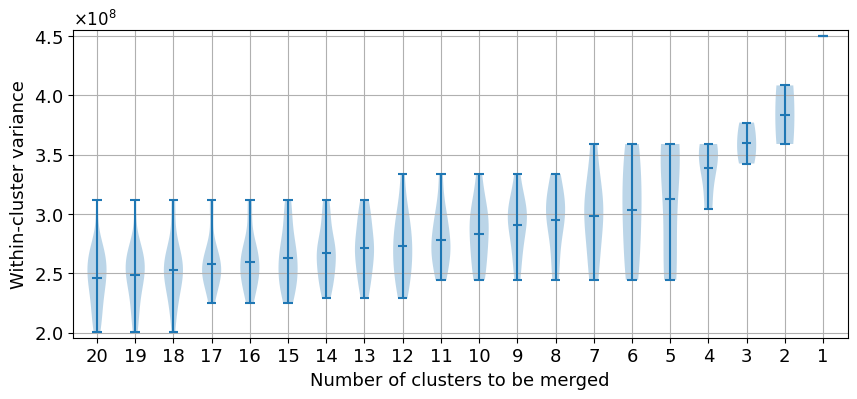

In [12]:
variance_array = []
for nb_clusters in nb_clusters_array:
    clustering_ward = models_ward[nb_clusters-1] ; variance_array.append([])
    for k in range(nb_clusters):
        reduced_data = data_for_clustering[clustering_ward.labels_ == k]
        variance_array[-1].append(np.var(reduced_data, axis=0).sum())

plt.figure(figsize=(10, 4))
plt.violinplot(variance_array, positions=nb_clusters_array[::-1], showmeans=True, showmedians=False, widths=0.5) ; plt.grid()
plt.xticks(nb_clusters_array, labels=nb_clusters_array[::-1], fontsize=13) ; plt.yticks(fontsize=13) ; plt.margins(x=0.02, y=0.02)
plt.xlabel("Number of clusters to be merged", fontsize=13) ; plt.ylabel("Within-cluster variance", fontsize=13)
plt.gca().yaxis.set_major_formatter(ScalarFormatter(useMathText=True)) ; plt.gca().yaxis.get_offset_text().set_fontsize(12)
# plt.savefig(f"Images/HAC_{method}_linkage_SSE_each_cluster.png", dpi=300, bbox_inches='tight')
plt.show()

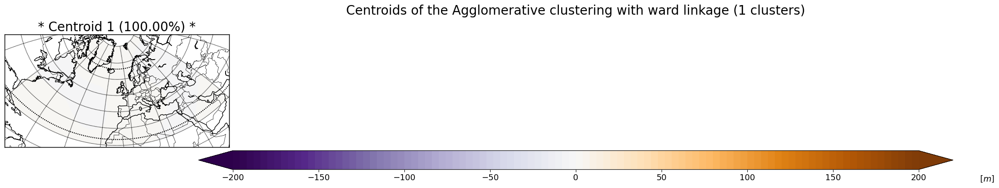

In [39]:
nb_clusters = 1 ; plot_centroids(nb_clusters=nb_clusters, method="ward")

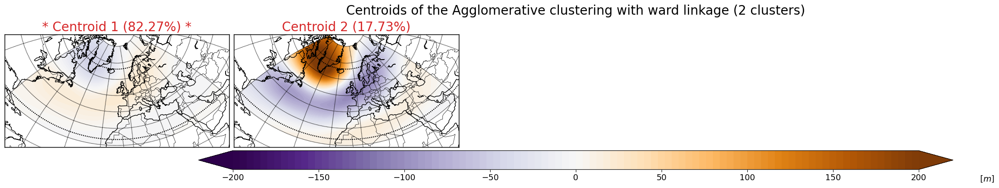

In [40]:
nb_clusters = 2 ; plot_centroids(nb_clusters=nb_clusters, method="ward")

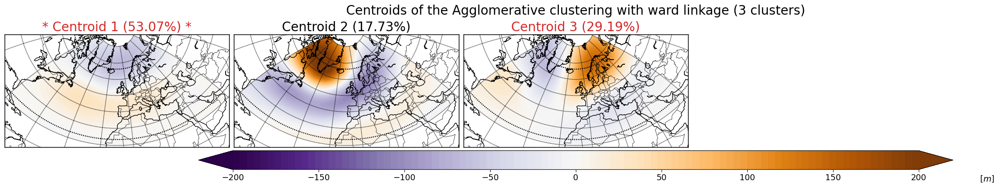

In [41]:
nb_clusters = 3 ; plot_centroids(nb_clusters=nb_clusters, method="ward")

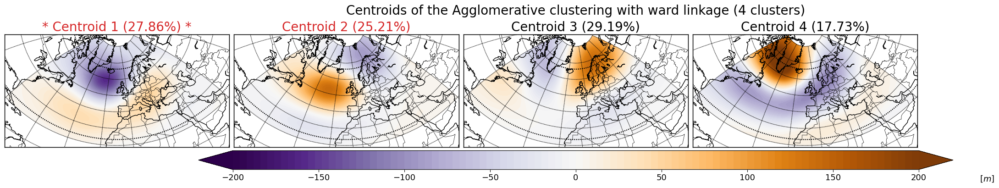

In [42]:
nb_clusters = 4 ; plot_centroids(nb_clusters=nb_clusters, method="ward")

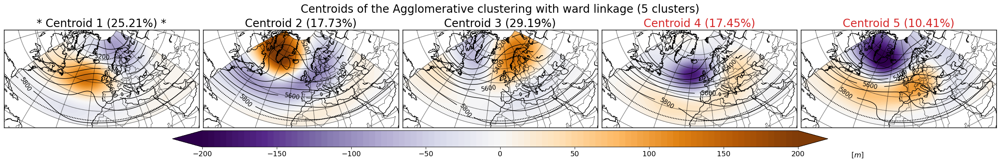

In [98]:
nb_clusters = 5 ; plot_centroids(nb_clusters=nb_clusters, method="ward", weather_regime=True)

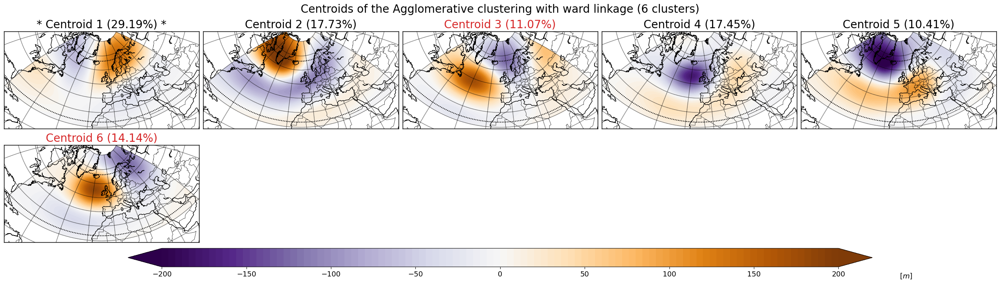

In [44]:
nb_clusters = 6 ; plot_centroids(nb_clusters=nb_clusters, method="ward")

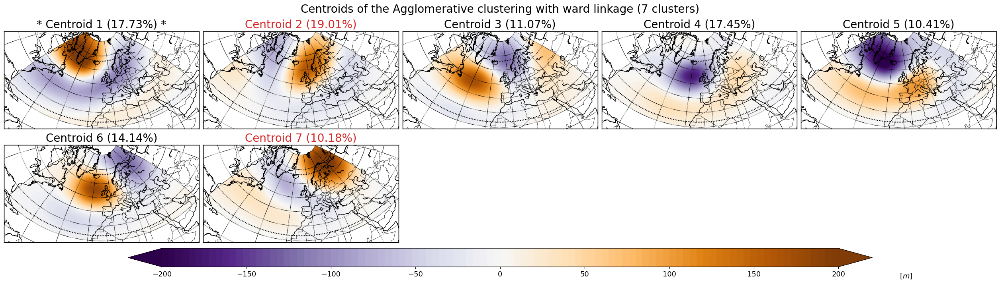

In [45]:
nb_clusters = 7 ; plot_centroids(nb_clusters=nb_clusters, method="ward")

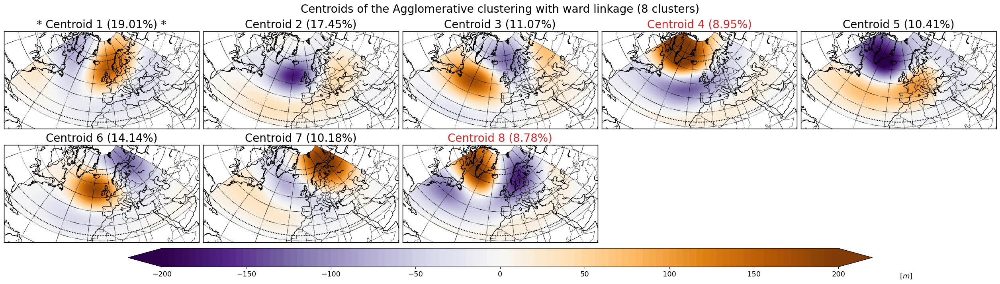

In [46]:
nb_clusters = 8 ; plot_centroids(nb_clusters=nb_clusters, method="ward")

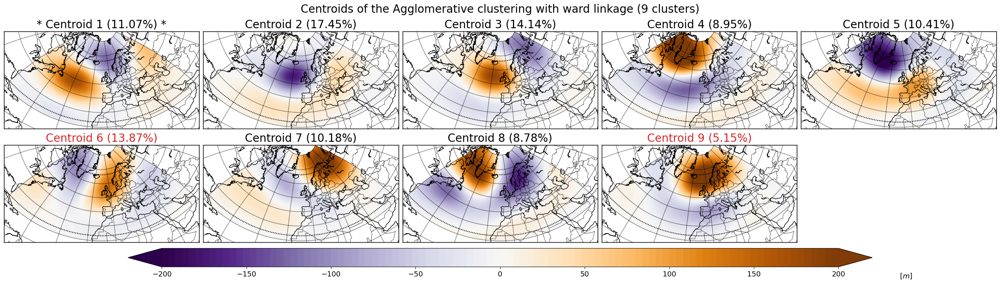

In [47]:
nb_clusters = 9 ; plot_centroids(nb_clusters=nb_clusters, method="ward")

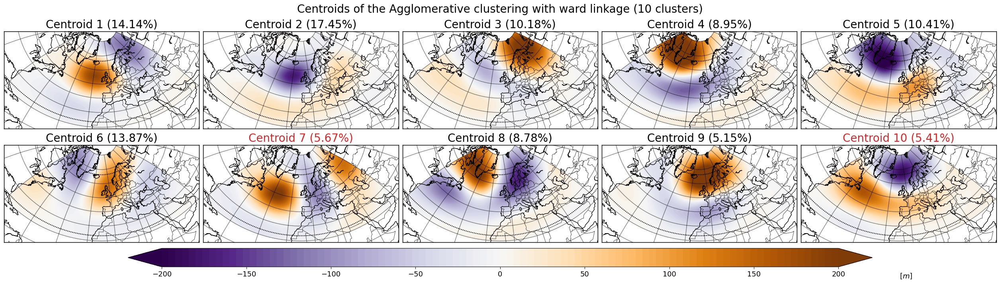

In [48]:
nb_clusters = 10 ; plot_centroids(nb_clusters=nb_clusters, method="ward")

In [76]:
savefig = True # True or False

### Create a list of letters for the cluster titles ###
letters = [chr(i + 65) for i in range(26)] # A-Z letters

nb_lats = len(dataset_dict["lats"]) ; nb_longs = len(dataset_dict["longs"])

def plot_centroids_individually(level, nb_clusters, frequency_array, centroids_original_space, savefig):
    print(f"Plotting the {nb_clusters} centroids at level {level}")
    ### Plot each cluster centroid individually ###
    for cluster_idx in range(nb_clusters):
        fig, ax = plt.subplots(figsize=(3.5, 2), constrained_layout=True)
        ax.set_title(f"{frequency_array[cluster_idx]:.1f}%", fontsize=15)

        ### Create the contour plot ###
        m, contour, ticks = create_contour_data(ax=ax, dataset_dict=dataset_dict, type_plot="geopotential_height_anomalies_temporal_mean",
                                                geopotential_height_data_to_plot=(centroids_original_space[cluster_idx, :]))
        if (savefig == True): plt.savefig(f"Images/HAC_tree/{letters[level]}{cluster_idx+1}.png", dpi=300, bbox_inches='tight') ; plt.close(fig)
        else: plt.show()

level = 0
initial_nb_clusters = 8

### Move up the tree to the next levels (with decreasing number of clusters) ###
for nb_clusters in range(initial_nb_clusters, 1, -1):
    clustering = models_ward[nb_clusters-1]
    y_pred = clustering.labels_
    frequency_array = np.bincount(y_pred) / len(y_pred) * 100

    ### Compute the centroids of the clusters in the original space ###
    if (nb_clusters == 1):
        centroids_original_space = (np.mean(data_for_clustering, axis=0) @ pca.components_).reshape(1, nb_lats, nb_longs)
    else:
        clf = NearestCentroid().fit(data_for_clustering, y_pred)
        centroids_original_space = (clf.centroids_ @ pca.components_).reshape(nb_clusters, nb_lats, nb_longs)

    ### Plot the centroids of the clusters individually ###
    plot_centroids_individually(level=level, nb_clusters=nb_clusters, frequency_array=frequency_array, centroids_original_space=centroids_original_space, savefig=savefig)
    level += 1

Plotting the 8 centroids at level 0
Plotting the 7 centroids at level 1
Plotting the 6 centroids at level 2
Plotting the 5 centroids at level 3
Plotting the 4 centroids at level 4
Plotting the 3 centroids at level 5
Plotting the 2 centroids at level 6


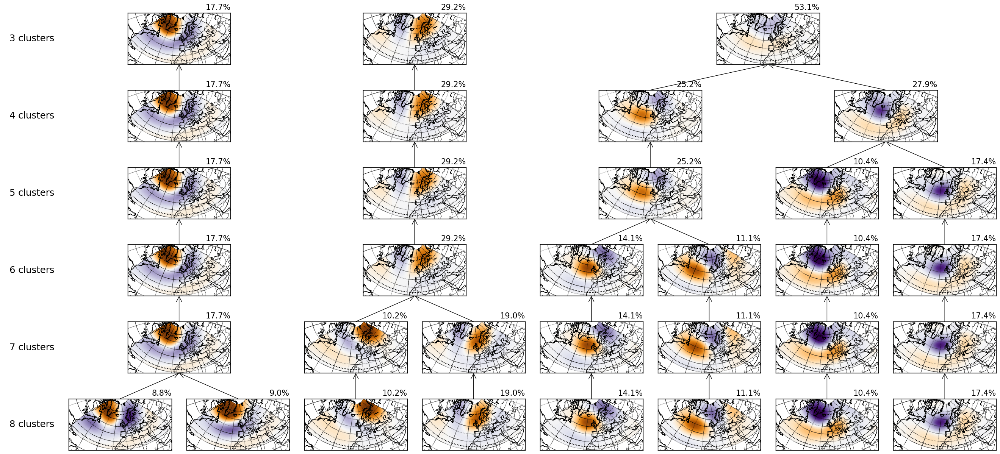

In [82]:
nrows = 6 ; ncols = 8*2+1 # 8 clusters at the bottom row + 1 empty subplot at the beginning of each row (for the cluster level title)
fig = plt.figure(figsize=(ncols*2, nrows*2.5)) # 1.5, 2
gs = GridSpec(nrows=nrows, ncols=ncols, figure=fig, wspace=0.05, hspace=0.5)

clusters_order = [[7, 3, 6, 0, 5, 2, 4, 1], [0, 6, 1, 5, 2, 4, 3], [1, 0, 5, 2, 4, 3], [1, 2, 0, 4, 3], [3, 2, 1, 0], [1, 2, 0], [1, 0], [0]] # Order of the clusters to plot in each row

positions = [[[1, 2], [3, 4], [5, 6], [7, 8], [9, 10], [11, 12], [13, 14], [15, 16]],
             [    [2, 3],     [5, 6], [7, 8], [9, 10], [11, 12], [13, 14], [15, 16]],
             [    [2, 3],         [6, 7],     [9, 10], [11, 12], [13, 14], [15, 16]],
             [    [2, 3],         [6, 7],         [10, 11],      [13, 14], [15, 16]],
             [    [2, 3],         [6, 7],         [10, 11],           [14, 15]     ],
             [    [2, 3],         [6, 7],                  [12, 13]               ], 
             [    [2, 3],                      [9, 10]                             ]] # Position of the clusters to plot in each row

connections = [[0, 0, 1, 2, 3, 4, 5, 6], [0, 1, 1, 2, 3, 4, 5], [0, 1, 2, 2, 3, 4], [0, 1, 2, 3, 3], [0, 1, 2, 2], [0, 1, 1], [0, 0]]

level = 0
all_axes = []
for nb_clusters in range(8, 8-nrows, -1):
    all_axes.append([])

    clustering = models_ward[nb_clusters-1]
    y_pred = clustering.labels_
    frequency_array = np.bincount(y_pred) / len(y_pred) * 100

    nb_lats = len(dataset_dict["lats"]) ; nb_longs = len(dataset_dict["longs"])

    ### Compute the centroids of the clusters in the original space ###
    if (nb_clusters == 1):
        centroids_original_space = (np.mean(data_for_clustering, axis=0) @ pca.components_).reshape(1, nb_lats, nb_longs)
    else:
        clf = NearestCentroid().fit(data_for_clustering, y_pred)
        centroids_original_space = (clf.centroids_ @ pca.components_).reshape(nb_clusters, nb_lats, nb_longs)

    ### Plot the centroids of the clusters individually ###
    for i in range(nb_clusters):
        cluster_idx = clusters_order[level][i] # Get the cluster index to plot
        position = positions[level][i]
        axis_to_plot = fig.add_subplot(gs[nrows-1-level, position[0]:position[1]+1])
        all_axes[level].append(axis_to_plot)
        axis_to_plot.set_title(f"{frequency_array[cluster_idx]:.1f}%", loc='right', fontsize=15)
        m, contour, ticks = create_contour_data(ax=axis_to_plot, dataset_dict=dataset_dict, type_plot="geopotential_height_anomalies_temporal_mean",
                                            geopotential_height_data_to_plot=(centroids_original_space[cluster_idx, :]), weather_regime=False)

    level += 1

### Add the level of the tree ###
nb_clusters = 8
for level in range(nrows):
    axis = fig.add_subplot(gs[nrows-1-level, 0])
    axis.text(0.5, 0.5, f"{nb_clusters} clusters", fontsize=17.5, ha='center', va='center')
    axis.set_axis_off() # Hide the axis

    if (nb_clusters > 8 - nrows + 1): # If the level is not the last one, add the connection to the next level
        for i in range(nb_clusters):
            # Increase the size of the head of the arrow
            con = ConnectionPatch(xyA=(0.5, 1), xyB=(0.5, 0), coordsA="axes fraction", coordsB="axes fraction", \
                                  axesA=all_axes[level][i], axesB=all_axes[level+1][connections[level][i]], color='k', linestyle='-', arrowstyle="->,head_length=1,head_width=0.5", zorder=5)
            all_axes[0][0].add_artist(con)

    nb_clusters -= 1

plt.savefig(f"Images/HAC_tree_centroids_PCA_{nb_modes}_modes_arrows.png", dpi=300, bbox_inches='tight')
plt.show()

In [9]:
def plot_centroids_KMeans(nb_clusters, cluster_centers, y_pred, method, cluster_names=None):
    nb_lats = len(dataset_dict["lats"]) ; nb_longs = len(dataset_dict["longs"])

    ### Project the cluster centers back to the original space ###
    centroids_original_space = (cluster_centers @ pca.components_).reshape(nb_clusters, nb_lats, nb_longs)

    ### Sort the clusters in descending order of their frequency of occurrence ###
    frequency_array = np.array([np.sum(y_pred == cluster_idx) / len(y_pred) * 100 for cluster_idx in range(nb_clusters)]) ; sorted_indices = np.argsort(frequency_array)[::-1]

    ncols = 4 ; nrows = int(np.ceil(nb_clusters / ncols)) # ncols = 4
    fig, axs = plt.subplots(nrows=nrows, ncols=ncols, figsize=(ncols*5, nrows*3+0.5), constrained_layout=True) # If save: nrows*3+0.5 - else: nrows*3+1

    for cluster_idx in range(nrows*ncols): # Loop over the cluster indices (starting from 0 --> +1)
        row = cluster_idx // ncols ; col = cluster_idx % ncols ; axis_to_plot = axs[col] if (nrows == 1) else axs[row, col]

        if (cluster_idx < nb_clusters):
            if cluster_names is not None: axis_to_plot.set_title(f"Cluster {cluster_idx+1}: {cluster_names[cluster_idx]} ({frequency_array[sorted_indices[cluster_idx]]:.1f}%)", fontsize=20)
            else: axis_to_plot.set_title(f"Cluster {cluster_idx+1} ({frequency_array[sorted_indices[cluster_idx]]:.2f}%)", fontsize=20)
            ### Create the contour plot ###
            m, contour, ticks = create_contour_data(ax=axis_to_plot, dataset_dict=dataset_dict, type_plot="geopotential_height_anomalies_temporal_mean",
                                                    geopotential_height_data_to_plot=(centroids_original_space[sorted_indices[cluster_idx], :]), weather_regime=True)
        else: axis_to_plot.set_visible(False)

    # fig.suptitle(f"Centroids {method} ({nb_clusters} clusters)", fontsize=20)
    cbar = fig.colorbar(contour, ax=axs, ticks=ticks, location='bottom', extend='both', shrink=0.75, pad=0.02, aspect=40)
    cbar.ax.tick_params(axis="x", labelsize=15, length=7.5, width=1)
    cbar.ax.text(x=1.1, y=-1.25, s=r'$[m]$', transform=cbar.ax.transAxes, ha='center', va='center', fontsize=15) # If save: y=-1.25 - else: y=-0.5
    plt.savefig(f"Images/KMeans_{nb_clusters}_centroids_PCA_{dataset_dict['first_year']}_{dataset_dict['last_year']}.png", dpi=300, bbox_inches="tight")
    plt.show()

K-Means algorithm with 4 clusters performed in 25.56 seconds.


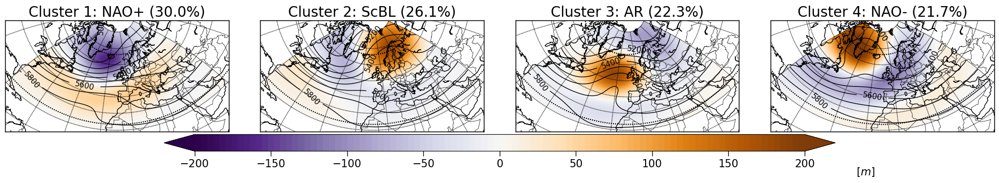

In [93]:
nb_clusters = 4 ; n_init = 1000
start_time = time.time()
kmeans_4 = KMeans(n_clusters=nb_clusters, init="k-means++", n_init=n_init).fit(data_for_clustering)
y_pred_kmeans_4 = kmeans_4.predict(data_for_clustering)
end_time = time.time()
print(f"K-Means algorithm with {nb_clusters} clusters performed in {end_time-start_time:.2f} seconds.")

### Sort the predicted labels based on the frequency of occurrence of each cluster ###
frequency_array_kmeans_4 = np.bincount(y_pred_kmeans_4) / len(y_pred_kmeans_4) * 100
sorted_indices_kmeans_4 = np.argsort(frequency_array_kmeans_4)[::-1]
y_pred_sorted_kmeans_4 = np.array([np.argwhere(sorted_indices_kmeans_4 == y_pred_kmeans_4[day])[0][0] for day in range(len(y_pred_kmeans_4))])

cluster_names_kmeans_4 = ["NAO+", "ScBL", "AR", "NAO-"]
plot_centroids_KMeans(nb_clusters=len(cluster_names_kmeans_4), cluster_centers=kmeans_4.cluster_centers_, y_pred=y_pred_kmeans_4, method="K-Means", cluster_names=cluster_names_kmeans_4)

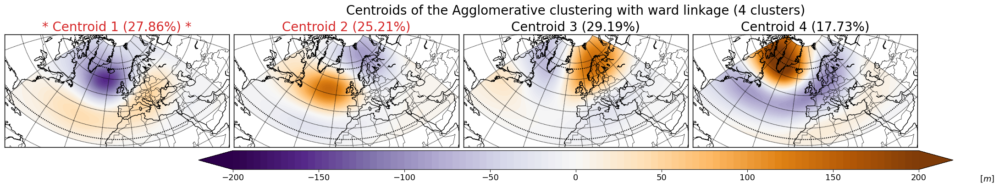

In [91]:
nb_clusters = 4 ; plot_centroids(nb_clusters=nb_clusters, method="ward")

In [ ]:
y_pred_HAC_4 = models_ward[3].labels_
frequency_array_HAC_4 = np.bincount(y_pred_HAC_4) / len(y_pred_HAC_4) * 100
sorted_indices_HAC_4 = np.argsort(frequency_array_HAC_4)[::-1]
print(sorted_indices_HAC_4)
y_pred_sorted_HAC_4 = np.array([np.argwhere(sorted_indices_HAC_4 == y_pred_HAC_4[day])[0][0] for day in range(len(y_pred_HAC_4))])

clf = NearestCentroid().fit(data_for_clustering, y_pred_HAC_4)
centroids_HAC_4 = clf.centroids_

[2 0 1 3]


In [122]:
avg_silhouette_score = silhouette_score(data_for_clustering, y_pred_HAC_4)
print(f"Average silhouette score for HAC with {nb_clusters} clusters: {avg_silhouette_score:.4f}")

Average silhouette score for HAC with 4 clusters: 0.0821


In [121]:
count = 0
for day in range(len(y_pred_sorted_HAC_4)):
    minimum_distance = np.inf ; closest_cluster = -1
    for cluster_idx in range(4):
        distance = np.linalg.norm(data_for_clustering[day] - centroids_HAC_4[cluster_idx])
        if (distance < minimum_distance):
            minimum_distance = distance ; closest_cluster = cluster_idx
    if (np.argwhere(sorted_indices_HAC_4 == closest_cluster)[0] != y_pred_sorted_HAC_4[day]):
        count += 1
print(f"Number of days with a different cluster assignment: {count} out of {len(y_pred_sorted_HAC_4)} ({count / len(y_pred_sorted_HAC_4) * 100:.2f}%)")

Number of days with a different cluster assignment: 1735 out of 7731 (22.44%)


73.10% of the predictions are similar


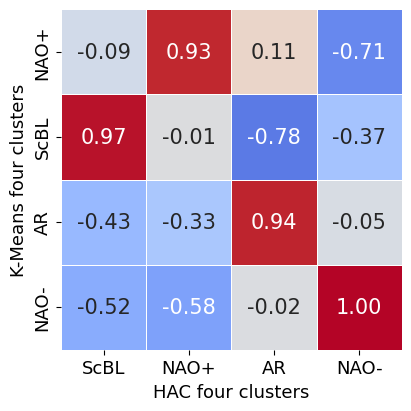

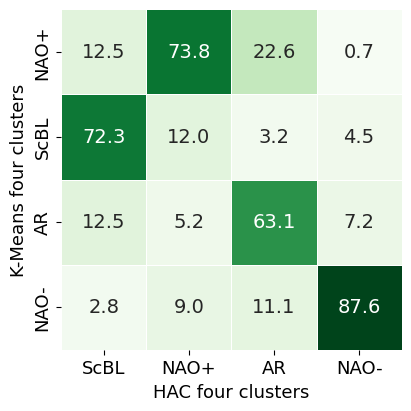

In [125]:
nb_clusters_kmeans = 4 ; nb_clusters_HAC = 4 ; kmeans = kmeans_4 ; centroids_HAC = centroids_HAC_4
cluster_names_kmeans = cluster_names_kmeans_4 ; cluster_names_HAC = ["ScBL", "NAO+", "AR", "NAO-"]
sorted_indices_kmeans = sorted_indices_kmeans_4 ; sorted_indices_HAC = sorted_indices_HAC_4
y_pred_sorted_kmeans = y_pred_sorted_kmeans_4 ; y_pred_sorted_HAC = y_pred_sorted_HAC_4

# Correlation between the centroids of the different clustering methods
correlation_KMeans_vs_HAC = np.zeros((nb_clusters_kmeans, nb_clusters_HAC))
number_of_similar_predictions = np.zeros((nb_clusters_kmeans, nb_clusters_HAC))
mapping = np.zeros(nb_clusters_kmeans, dtype=int) # Mapping of the KMeans clusters to the HAC clusters
for i in range(nb_clusters_kmeans):
    for j in range(nb_clusters_HAC):
        correlation_KMeans_vs_HAC[i, j] = np.corrcoef(kmeans.cluster_centers_[sorted_indices_kmeans[i], :].flatten(), centroids_HAC[sorted_indices_HAC_4[j], :].flatten())[0, 1]
        ### Count number of samples within cluster i of KMeans 4 and j of KMeans 7 ###
        mask = (y_pred_sorted_kmeans == i) & (y_pred_sorted_HAC == j) ; count = np.sum(mask) ; number_of_similar_predictions[i, j] = count / np.sum(y_pred_sorted_HAC == j) * 100
    mapping[i] = np.argmax(correlation_KMeans_vs_HAC[i, :]) # Find the HAC cluster with the highest correlation to the KMeans cluster i

new_y_pred_sorted_kmeans = np.zeros_like(y_pred_sorted_HAC)
for day in range(len(y_pred_sorted_HAC)):
    new_y_pred_sorted_kmeans[day] = mapping[y_pred_sorted_kmeans[day]] # Map the KMeans cluster to the HAC cluster
print(f"{np.sum(np.equal(new_y_pred_sorted_kmeans, y_pred_sorted_HAC)) / len(y_pred_sorted_kmeans) * 100:.2f}% of the predictions are similar")

fig, axs = plt.subplots(1, 1, figsize=(5, 4), constrained_layout=True)
sns.heatmap(correlation_KMeans_vs_HAC, annot=True, fmt=".2f", annot_kws={"fontsize":15}, cmap="coolwarm", cbar=False, ax=axs, square=True, linewidths=0.5, center=0, vmin=-1, vmax=1)
axs.set_xlabel("HAC four clusters", fontsize=13) ; axs.set_ylabel("K-Means four clusters", fontsize=13)
axs.set_xticks(np.arange(nb_clusters_HAC) + 0.5, labels=cluster_names_HAC, fontsize=13) ; axs.set_yticks(np.arange(nb_clusters_kmeans) + 0.5, labels=cluster_names_kmeans, fontsize=13)
# plt.savefig(f"Images/KMeans_4_vs_7_correlation.png", dpi=300, bbox_inches="tight")
plt.show()

fig, axs = plt.subplots(1, 1, figsize=(5, 4), constrained_layout=True)
sns.heatmap(number_of_similar_predictions, annot=True, fmt=".1f", annot_kws={"fontsize":14}, cmap="Greens", cbar=False, ax=axs, square=True, linewidths=0.5, vmin=0, vmax=np.max(number_of_similar_predictions))
axs.set_xlabel("HAC four clusters", fontsize=13) ; axs.set_ylabel("K-Means four clusters", fontsize=13)
axs.set_xticks(np.arange(nb_clusters_HAC) + 0.5, labels=cluster_names_HAC, fontsize=13) ; axs.set_yticks(np.arange(nb_clusters_kmeans) + 0.5, labels=cluster_names_kmeans, fontsize=13)
# plt.savefig(f"Images/KMeans_4_vs_7_number_of_similar_predictions.png", dpi=300, bbox_inches="tight")
plt.show()

K-Means algorithm with 8 clusters performed in 20.36 seconds.


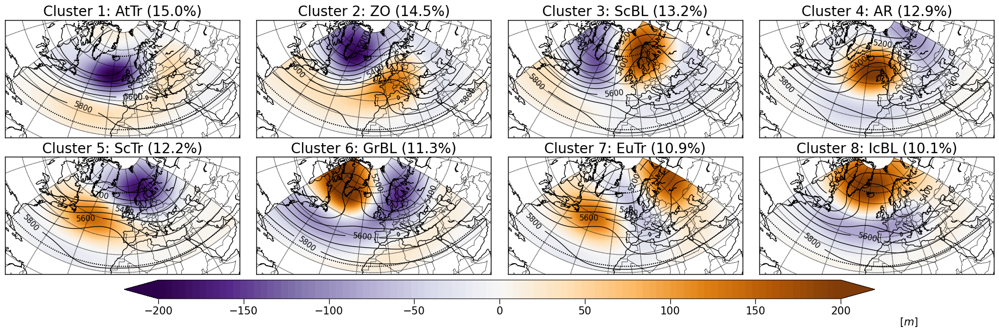

In [10]:
nb_clusters = 8 ; n_init = 500
start_time = time.time()
kmeans_8 = KMeans(n_clusters=nb_clusters, init="k-means++", n_init=n_init).fit(data_for_clustering)
y_pred_kmeans_8 = kmeans_8.predict(data_for_clustering)
end_time = time.time()
print(f"K-Means algorithm with {nb_clusters} clusters performed in {end_time-start_time:.2f} seconds.")

### Sort the predicted labels based on the frequency of occurrence of each cluster ###
frequency_array_kmeans_8 = np.bincount(y_pred_kmeans_8) / len(y_pred_kmeans_8) * 100
sorted_indices_kmeans_8 = np.argsort(frequency_array_kmeans_8)[::-1]
y_pred_sorted_kmeans_8 = np.array([np.argwhere(sorted_indices_kmeans_8 == y_pred_kmeans_8[day])[0][0] for day in range(len(y_pred_kmeans_8))])

cluster_names_kmeans_8 = ["AtTr", "ZO", "ScBL", "AR", "ScTr", "GrBL", "EuTr", "IcBL"]
plot_centroids_KMeans(nb_clusters=len(cluster_names_kmeans_8), cluster_centers=kmeans_8.cluster_centers_, y_pred=y_pred_kmeans_8, method="K-Means", cluster_names=cluster_names_kmeans_8)

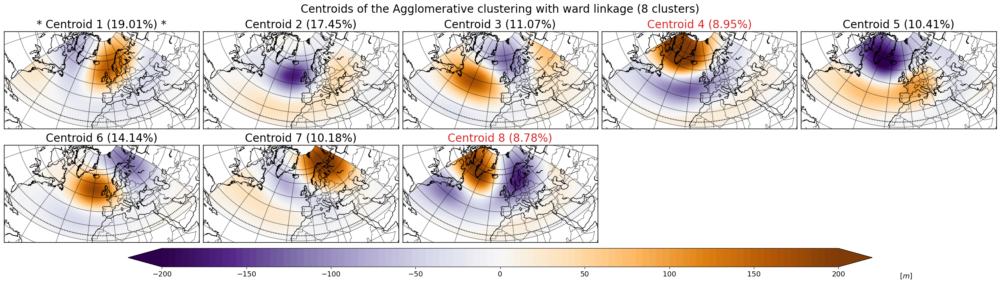

In [21]:
nb_clusters = 8 ; plot_centroids(nb_clusters=nb_clusters, method="ward")

In [12]:
y_pred_HAC_8 = models_ward[7].labels_
frequency_array_HAC_8 = np.bincount(y_pred_HAC_8) / len(y_pred_HAC_8) * 100
sorted_indices_HAC_8 = np.argsort(frequency_array_HAC_8)[::-1]
print(sorted_indices_HAC_8)
y_pred_sorted_HAC_8 = np.array([np.argwhere(sorted_indices_HAC_8 == y_pred_HAC_8[day])[0][0] for day in range(len(y_pred_HAC_8))])

clf = NearestCentroid().fit(data_for_clustering, y_pred_HAC_8)
centroids_HAC_8 = clf.centroids_

[0 1 5 2 4 6 3 7]


In [14]:
count = 0
for day in range(len(y_pred_sorted_HAC_8)):
    minimum_distance = np.inf ; closest_cluster = -1
    for cluster_idx in range(8):
        distance = np.linalg.norm(data_for_clustering[day] - centroids_HAC_8[cluster_idx])
        if (distance < minimum_distance):
            minimum_distance = distance ; closest_cluster = cluster_idx
    if (np.argwhere(sorted_indices_HAC_8 == closest_cluster)[0] != y_pred_sorted_HAC_8[day]):
        count += 1
print(f"Number of days with a different cluster assignment: {count} out of {len(y_pred_sorted_HAC_8)} ({count / len(y_pred_sorted_HAC_8) * 100:.2f}%)")

Number of days with a different cluster assignment: 2325 out of 7731 (30.07%)


54.57% of the predictions are similar


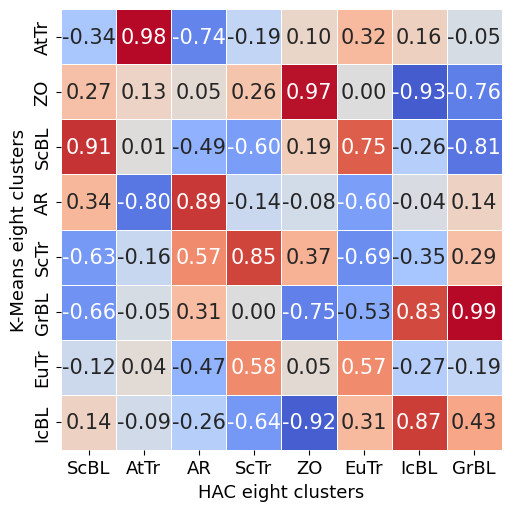

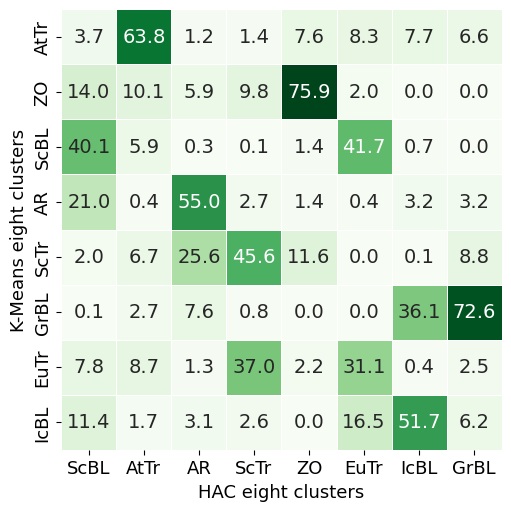

In [30]:
nb_clusters_kmeans = 8 ; nb_clusters_HAC = 8 ; kmeans = kmeans_8 ; centroids_HAC = centroids_HAC_8
cluster_names_kmeans = cluster_names_kmeans_8 ; cluster_names_HAC = ["ScBL", "AtTr", "AR", "ScTr", "ZO", "EuTr", "IcBL", "GrBL"]
sorted_indices_kmeans = sorted_indices_kmeans_8 ; sorted_indices_HAC = sorted_indices_HAC_8
y_pred_sorted_kmeans = y_pred_sorted_kmeans_8 ; y_pred_sorted_HAC = y_pred_sorted_HAC_8

# Correlation between the centroids of the different clustering methods
correlation_KMeans_vs_HAC = np.zeros((nb_clusters_kmeans, nb_clusters_HAC))
number_of_similar_predictions = np.zeros((nb_clusters_kmeans, nb_clusters_HAC))
mapping = np.zeros(nb_clusters_kmeans, dtype=int) # Mapping of the KMeans clusters to the HAC clusters
for i in range(nb_clusters_kmeans):
    for j in range(nb_clusters_HAC):
        correlation_KMeans_vs_HAC[i, j] = np.corrcoef(kmeans.cluster_centers_[sorted_indices_kmeans[i], :].flatten(), centroids_HAC[sorted_indices_HAC[j], :].flatten())[0, 1]
        ### Count number of samples within cluster i of KMeans 4 and j of KMeans 7 ###
        mask = (y_pred_sorted_kmeans == i) & (y_pred_sorted_HAC == j) ; count = np.sum(mask) ; number_of_similar_predictions[i, j] = count / np.sum(y_pred_sorted_HAC == j) * 100
    mapping[i] = np.argmax(correlation_KMeans_vs_HAC[i, :]) # Find the HAC cluster with the highest correlation to the KMeans cluster i

new_y_pred_sorted_kmeans = np.zeros_like(y_pred_sorted_HAC)
for day in range(len(y_pred_sorted_HAC)):
    new_y_pred_sorted_kmeans[day] = mapping[y_pred_sorted_kmeans[day]] # Map the KMeans cluster to the HAC cluster
print(f"{np.sum(np.equal(new_y_pred_sorted_kmeans, y_pred_sorted_HAC)) / len(y_pred_sorted_kmeans) * 100:.2f}% of the predictions are similar")

fig, axs = plt.subplots(1, 1, figsize=(6, 5), constrained_layout=True)
sns.heatmap(correlation_KMeans_vs_HAC, annot=True, fmt=".2f", annot_kws={"fontsize":15}, cmap="coolwarm", cbar=False, ax=axs, square=True, linewidths=0.5, center=0, vmin=-1, vmax=1)
axs.set_xlabel("HAC eight clusters", fontsize=13) ; axs.set_ylabel("K-Means eight clusters", fontsize=13)
axs.set_xticks(np.arange(nb_clusters_HAC) + 0.5, labels=cluster_names_HAC, fontsize=13) ; axs.set_yticks(np.arange(nb_clusters_kmeans) + 0.5, labels=cluster_names_kmeans, fontsize=13)
# plt.savefig(f"Images/KMeans_4_vs_7_correlation.png", dpi=300, bbox_inches="tight")
plt.show()

fig, axs = plt.subplots(1, 1, figsize=(6, 5), constrained_layout=True)
sns.heatmap(number_of_similar_predictions, annot=True, fmt=".1f", annot_kws={"fontsize":14}, cmap="Greens", cbar=False, ax=axs, square=True, linewidths=0.5, vmin=0, vmax=np.max(number_of_similar_predictions))
axs.set_xlabel("HAC eight clusters", fontsize=13) ; axs.set_ylabel("K-Means eight clusters", fontsize=13)
axs.set_xticks(np.arange(nb_clusters_HAC) + 0.5, labels=cluster_names_HAC, fontsize=13) ; axs.set_yticks(np.arange(nb_clusters_kmeans) + 0.5, labels=cluster_names_kmeans, fontsize=13)
# plt.savefig(f"Images/KMeans_4_vs_7_number_of_similar_predictions.png", dpi=300, bbox_inches="tight")
plt.show()